# Accident Severity Classifier for Vehicle Accidents in the city of Seattle
## Applied Capstone Project : Part of the IBM Data Science Professional Ceritificate

## Table of contents
* [Introduction: Business Understanding](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)



## Introduction: Business Understanding <a name="introduction"></a>

As we all know, Seattle is a major seaport city on the West Coast of the United States in the northwestern state of Washington. Seattle is the largest city in both the state of Washington and the Pacific Northwest region of North America. According to U.S. Census data released in 2019, the Seattle metropolitan area's population stands at 3.98 million, making it the 15th-largest in the United States. As of July 2016, Seattle was the fastest-growing major U.S. city, with a 3.1% annual growth rate.

Like any other fast growing city in America, an increase in development coincides with an increase in population which in turn leads to more and more automobiles traversing through the city. As of 2016, the number of vehicles in Seattle hit a new high of 446,000. More automobiles means a higher number of vehicle accidents take place. As you might have guessed then, our goal for today's project is to analyze vehicle accident data from the city of Seattle and apply Machine Learning techniques to determine which attributes and conditions (for example, road condition and weather) are more likely to lead to a vehicle accident.

## Data <a name="data"></a>

The dataset that we will be using for this project is a collection of records of vehicle collisions that have taken place in Seattle city proper between the years 2004-present. The data has been recorded by the Seattle Police Department (SPD) and compiled together by the Seattle Department of Transportation (SDOT). The dataset itself can be found [here](https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Data-Collisions.csv), while the metadata for the dataset can be found [here](https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Metadata.pdf). The dataset contains a total of 194,673 records and 37 columns. The dataset will undergo extensive cleaning and engineering before it can be used for training our models. 

The target variable we will be trying to predict is Accident Severity, which is a binary variable that classifies whether a particular accident involved Property damage only or Injury to a person as well.

With that said and done, let's begin loading the data and begin preparing it for analysis.

Let us begin by importing all the modules we will be using in the project.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn import preprocessing
import random
import seaborn as sns
from sklearn.metrics import accuracy_score,f1_score,log_loss,classification_report,confusion_matrix,jaccard_similarity_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import metrics
import pydotplus
from datetime import date
import matplotlib.image as mpimg
from io import StringIO
import itertools
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import folium
import webbrowser
from folium import plugins
from sklearn import tree

### 1. Loading The Data

Let's upload the dataset into a newly created pandas dataframe.

In [2]:
df=pd.read_csv('G:\Classwork\Extra course data\Datasets\Data-Collisions-Main.csv')
df.head(5)

G:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (21) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,OBJECTID,INCKEY,INCDATE,INCDTTM,LOCATION,ADDRTYPE,JUNCTIONTYPE,X,Y,STATUS,...,PEDROWNOTGRNT,HITPARKEDCAR,UNDERINFL,SPEEDING,INATTENTIONIND,WEATHER,ROADCOND,LIGHTCOND,SEVERITYDESC,SEVERITYCODE
0,1,1307,2013/03/27 00:00:00+00,3/27/2013 2:54:00 PM,5TH AVE NE AND NE 103RD ST,Intersection,At Intersection (intersection related),-122.323148,47.703140,Matched,...,NaN,N,N,NaN,NaN,Overcast,Wet,Daylight,Injury Collision,2
1,2,52200,2006/12/20 00:00:00+00,12/20/2006 6:55:00 PM,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,Block,Mid-Block (not related to intersection),-122.347294,47.647172,Matched,...,NaN,N,0,NaN,NaN,Raining,Wet,Dark - Street Lights On,Property Damage Only Collision,1
2,3,26700,2004/11/18 00:00:00+00,11/18/2004 10:20:00 AM,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,Block,Mid-Block (not related to intersection),-122.334540,47.607871,Matched,...,NaN,N,0,NaN,NaN,Overcast,Dry,Daylight,Property Damage Only Collision,1
3,4,1144,2013/03/29 00:00:00+00,3/29/2013 9:26:00 AM,2ND AVE BETWEEN MARION ST AND MADISON ST,Block,Mid-Block (not related to intersection),-122.334803,47.604803,Matched,...,NaN,N,N,NaN,NaN,Clear,Dry,Daylight,Property Damage Only Collision,1
4,5,17700,2004/01/28 00:00:00+00,1/28/2004 8:04:00 AM,SWIFT AVE S AND SWIFT AV OFF RP,Intersection,At Intersection (intersection related),-122.306426,47.545739,Matched,...,NaN,N,0,NaN,NaN,Raining,Wet,Daylight,Injury Collision,2


In [3]:
df.shape

(194673, 37)

As we mentioned before, our dataset contains 194,673 rows and 37 columns. Lets examine all of our attributes in a bit more detail.

In [4]:
df.columns

Index(['OBJECTID', 'INCKEY', 'INCDATE', 'INCDTTM', 'LOCATION', 'ADDRTYPE',
       'JUNCTIONTYPE', 'X', 'Y', 'STATUS', 'COLDETKEY', 'REPORTNO', 'INTKEY',
       'SEGLANEKEY', 'CROSSWALKKEY', 'EXCEPTRSNCODE', 'EXCEPTRSNDESC',
       'SDOTCOLNUM', 'SDOT_COLDESC', 'SDOT_COLCODE', 'ST_COLDESC',
       'ST_COLCODE', 'COLLISIONTYPE', 'VEHCOUNT', 'PERSONCOUNT', 'PEDCYLCOUNT',
       'PEDCOUNT', 'PEDROWNOTGRNT', 'HITPARKEDCAR', 'UNDERINFL', 'SPEEDING',
       'INATTENTIONIND', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'SEVERITYDESC',
       'SEVERITYCODE'],
      dtype='object')

In [5]:
#Datatypes of each attribute
df.dtypes

OBJECTID            int64
INCKEY              int64
INCDATE            object
INCDTTM            object
LOCATION           object
ADDRTYPE           object
JUNCTIONTYPE       object
X                 float64
Y                 float64
STATUS             object
COLDETKEY           int64
REPORTNO           object
INTKEY            float64
SEGLANEKEY          int64
CROSSWALKKEY        int64
EXCEPTRSNCODE      object
EXCEPTRSNDESC      object
SDOTCOLNUM        float64
SDOT_COLDESC       object
SDOT_COLCODE        int64
ST_COLDESC         object
ST_COLCODE         object
COLLISIONTYPE      object
VEHCOUNT            int64
PERSONCOUNT         int64
PEDCYLCOUNT         int64
PEDCOUNT            int64
PEDROWNOTGRNT      object
HITPARKEDCAR       object
UNDERINFL          object
SPEEDING           object
INATTENTIONIND     object
WEATHER            object
ROADCOND           object
LIGHTCOND          object
SEVERITYDESC       object
SEVERITYCODE        int64
dtype: object

### 2. Data Preprocessing

As you might have noticed, the raw data consists of a lot of information in terms of both number of records and features. A lot of this data will require cleaning and preprocessing before it can be used for analysis.

#### Feature Reduction

We will begin Data Preprocessing and Preparation by performing some amount of feature reduction. As we can see, our dataset consists of a lot of attributes which are redundant, irrelevant in terms of modeling purposes or do not contirbute significantly towards predicitng our target variable of accident severity. As more features means more complexity in modeling and more consumption of computational resources, we will look to drop these unnecessary variables.

Here is a list of variables we will be dropping from our dataset:

1. KEYS (OBJECTID, COLDETKEY, REPORTNO, INTKEY, SEGLANEKEY, CROSSWALKKEY, EXCEPTRSNCODE, EXCEPTRSNDESC, SDOTCOLNUM) : These columns are keys or numbers that have been assigned by SDOT to uniquely identify certain records, incidents and locations. This data is irrelevant and not useful for modeling. We will only keep INCKEY as our unique identifier for our records.

2. STATUS : Irrelevant variable.

3. INCDATE: As the date of the incident is already present in INCDTTM, this is a redundant variable and therefore safe to drop.

4. LOCATION: The street addresses of the accidents. As we already have Latitude and Longitude co-ordinates which we can use to plot on a map, this variable is redundant and therefore can be dropped.

5. ST_COLDESC, ST_COLCODE: There are two collision codesets in the data to identify collisions, ST codes and SDOT codes. Since we are using the SDOT codes to identify the types of collisions in our EDA, we can drop the ST codes.


6. VEHCOUNT, PERSONCOUNT, PEDCYLCOUNT, PEDCOUNT, PEDROWNOTGRNT, HITPARKEDCAR: These attributes are descriptive statistics recorded after the accident has already taken place. Since we are more interested in the features which describe the conditions preceding the accident, these attributes are not that useful for modeling or EDA.

In [6]:
df.drop(['OBJECTID','COLDETKEY','REPORTNO','INTKEY','SEGLANEKEY','CROSSWALKKEY','EXCEPTRSNCODE','EXCEPTRSNDESC','SDOTCOLNUM','STATUS',
        'INCDATE','LOCATION','ST_COLDESC','ST_COLCODE','VEHCOUNT','PERSONCOUNT','PEDCYLCOUNT','PEDCOUNT','PEDROWNOTGRNT','HITPARKEDCAR'],axis=1,inplace=True)

In [7]:
df.head()

,INCKEY,INCDTTM,ADDRTYPE,JUNCTIONTYPE,X,Y,SDOT_COLDESC,SDOT_COLCODE,COLLISIONTYPE,UNDERINFL,SPEEDING,INATTENTIONIND,WEATHER,ROADCOND,LIGHTCOND,SEVERITYDESC,SEVERITYCODE
0,1307,3/27/2013 2:54:00 PM,Intersection,At Intersection (intersection related),-122.323148,47.703140,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",11,Angles,N,NaN,NaN,Overcast,Wet,Daylight,Injury Collision,2
1,52200,12/20/2006 6:55:00 PM,Block,Mid-Block (not related to intersection),-122.347294,47.647172,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE ...",16,Sideswipe,0,NaN,NaN,Raining,Wet,Dark - Street Lights On,Property Damage Only Collision,1
2,26700,11/18/2004 10:20:00 AM,Block,Mid-Block (not related to intersection),-122.334540,47.607871,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",14,Parked Car,0,NaN,NaN,Overcast,Dry,Daylight,Property Damage Only Collision,1
3,1144,3/29/2013 9:26:00 AM,Block,Mid-Block (not related to intersection),-122.334803,47.604803,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",11,Other,N,NaN,NaN,Clear,Dry,Daylight,Property Damage Only Collision,1
4,17700,1/28/2004 8:04:00 AM,Intersection,At Intersection (intersection related),-122.306426,47.545739,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",11,Angles,0,NaN,NaN,Raining,Wet,Daylight,Injury Collision,2


In [8]:
df.columns

Index(['INCKEY', 'INCDTTM', 'ADDRTYPE', 'JUNCTIONTYPE', 'X', 'Y',
       'SDOT_COLDESC', 'SDOT_COLCODE', 'COLLISIONTYPE', 'UNDERINFL',
       'SPEEDING', 'INATTENTIONIND', 'WEATHER', 'ROADCOND', 'LIGHTCOND',
       'SEVERITYDESC', 'SEVERITYCODE'],
      dtype='object')

#### Dealing with Missing Values and Data Transformation

Multiple columns in our data have either missing values or values stored in inconsistent formatting. In this section we will deal with each of these problems.

In [9]:
#Replace missing values with 0 and one hot encoding for remaining values
df['UNDERINFL'].replace(np.nan,"0",inplace=True)
df['UNDERINFL'].replace("N", "0", inplace=True)
df['UNDERINFL'].replace("Y", "1", inplace=True)

In [10]:
df['UNDERINFL'].value_counts()

0    185552
1      9121
Name: UNDERINFL, dtype: int64

In [11]:
df['INATTENTIONIND'].replace(np.nan,"0",inplace=True)
df['INATTENTIONIND'].replace("Y","1",inplace=True)

In [12]:
df['INATTENTIONIND'].value_counts()

0    164868
1     29805
Name: INATTENTIONIND, dtype: int64

In [13]:
df['SPEEDING'].replace(np.nan,"0",inplace=True)
df['SPEEDING'].replace("Y","1",inplace=True)

In [14]:
df['SPEEDING'].value_counts()

0    185340
1      9333
Name: SPEEDING, dtype: int64

3 of our columns: Weather, Road condition and Light condition are multiclass categorical variables. However, one of the classes in each is labelled 'Unknown'. This is as good as a missing value so we'll replace it with numpy's NaN (Not a Number), as this will make it easier to handle when we deal with the missing values in these columns.

In [15]:
df['WEATHER'].replace("Unknown",np.nan,inplace=True)
df['ROADCOND'].replace("Unknown",np.nan,inplace=True)
df['LIGHTCOND'].replace("Unknown",np.nan,inplace=True)

Let's take a look to see how many missing values are left in the remainder of our columns.

In [16]:
df.isnull().sum()

INCKEY                0
INCDTTM               0
ADDRTYPE           1926
JUNCTIONTYPE       6338
X                  5334
Y                  5334
SDOT_COLDESC          0
SDOT_COLCODE          0
COLLISIONTYPE      4904
UNDERINFL             0
SPEEDING              0
INATTENTIONIND        0
WEATHER           21004
ROADCOND          20222
LIGHTCOND         18878
SEVERITYDESC          0
SEVERITYCODE          0
dtype: int64

We immediately notice that our Longitude and Latitude variables (X and Y) have some missing values. Since, this is geospatial data, dealing with missing values here is very complex and would require the use of some sort of geography-based libraries. Since it is a very small portion of the data, it makes more sense just to drop the missing values.

In [17]:
df.dropna(subset=["X"], axis=0, inplace=True)
df.dropna(subset=["Y"], axis=0, inplace=True)
df.reset_index(drop=True, inplace=True)
df.isnull().sum()

INCKEY                0
INCDTTM               0
ADDRTYPE              0
JUNCTIONTYPE       4199
X                     0
Y                     0
SDOT_COLDESC          0
SDOT_COLCODE          0
COLLISIONTYPE      4757
UNDERINFL             0
SPEEDING              0
INATTENTIONIND        0
WEATHER           19591
ROADCOND          18814
LIGHTCOND         17632
SEVERITYDESC          0
SEVERITYCODE          0
dtype: int64

Since the remaining variables with missing values are categorical variables, it makes sense to replace the missing values in these variables on the basis of frequency of occurence of categories within these variables.

In [18]:
df['ROADCOND'].value_counts()

Dry               122076
Wet                46064
Ice                 1177
Snow/Slush           989
Standing Water       102
Sand/Mud/Dirt         64
Oil                   53
Name: ROADCOND, dtype: int64

Since the class 'Dry' is a clear winner here in terms of frequency, we can replace the missing values here with 'Dry' without affecting our data too much. The missing records here are a very small percentage of our overall data.

In [19]:
df['ROADCOND'].replace(np.nan,"Dry",inplace = True)
df.isnull().sum()

INCKEY                0
INCDTTM               0
ADDRTYPE              0
JUNCTIONTYPE       4199
X                     0
Y                     0
SDOT_COLDESC          0
SDOT_COLCODE          0
COLLISIONTYPE      4757
UNDERINFL             0
SPEEDING              0
INATTENTIONIND        0
WEATHER           19591
ROADCOND              0
LIGHTCOND         17632
SEVERITYDESC          0
SEVERITYCODE          0
dtype: int64

We can apply the same methodology towards some of our other columns with missing values.

In [20]:
df['WEATHER'].value_counts()

Clear                       108959
Raining                      32015
Overcast                     27136
Snowing                        894
Fog/Smog/Smoke                 553
Sleet/Hail/Freezing Rain       112
Blowing Sand/Dirt               50
Severe Crosswind                24
Partly Cloudy                    5
Name: WEATHER, dtype: int64

In [21]:
df['WEATHER'].replace(np.nan,"Clear",inplace=True)
df.isnull().sum()

INCKEY                0
INCDTTM               0
ADDRTYPE              0
JUNCTIONTYPE       4199
X                     0
Y                     0
SDOT_COLDESC          0
SDOT_COLCODE          0
COLLISIONTYPE      4757
UNDERINFL             0
SPEEDING              0
INATTENTIONIND        0
WEATHER               0
ROADCOND              0
LIGHTCOND         17632
SEVERITYDESC          0
SEVERITYCODE          0
dtype: int64

In [22]:
df['LIGHTCOND'].value_counts()

Daylight                   113582
Dark - Street Lights On     47314
Dusk                         5775
Dark - No Street Lights      2614
Dawn                         2422
Name: LIGHTCOND, dtype: int64

In [23]:
df['LIGHTCOND'].replace(np.nan,"Daylight",inplace=True)
df.isnull().sum()

INCKEY               0
INCDTTM              0
ADDRTYPE             0
JUNCTIONTYPE      4199
X                    0
Y                    0
SDOT_COLDESC         0
SDOT_COLCODE         0
COLLISIONTYPE     4757
UNDERINFL            0
SPEEDING             0
INATTENTIONIND       0
WEATHER              0
ROADCOND             0
LIGHTCOND            0
SEVERITYDESC         0
SEVERITYCODE         0
dtype: int64

In [24]:
df['COLLISIONTYPE'].value_counts()

Parked Car    46381
Angles        34460
Rear Ended    32968
Other         22277
Sideswipe     18034
Left Turn     13624
Pedestrian     6551
Cycles         5378
Right Turn     2912
Head On        1997
Name: COLLISIONTYPE, dtype: int64

As there is no clear majority in this case, it does not make sense to assume exactly what type of collision may have taken place, it simply makes more sense to classify the missing values as class 'Other' since it already exists.

In [25]:
df['COLLISIONTYPE'].replace(np.nan,"Other",inplace=True)
df.isnull().sum()

INCKEY               0
INCDTTM              0
ADDRTYPE             0
JUNCTIONTYPE      4199
X                    0
Y                    0
SDOT_COLDESC         0
SDOT_COLCODE         0
COLLISIONTYPE        0
UNDERINFL            0
SPEEDING             0
INATTENTIONIND       0
WEATHER              0
ROADCOND             0
LIGHTCOND            0
SEVERITYDESC         0
SEVERITYCODE         0
dtype: int64

In [26]:
df['JUNCTIONTYPE'].value_counts()

Mid-Block (not related to intersection)              87390
At Intersection (intersection related)               62491
Mid-Block (but intersection related)                 22465
Driveway Junction                                    10580
At Intersection (but not related to intersection)     2071
Ramp Junction                                          143
Name: JUNCTIONTYPE, dtype: int64

As this attribute is location-based, it does not make logical sense to assume the missing values. Since it is a very miniscule number of missing values, we can drop those rows without noticeable effect to our data.

In [27]:
df.dropna(subset=["JUNCTIONTYPE"], axis=0, inplace=True)
df.reset_index(drop=True, inplace=True)
df.isnull().sum()

INCKEY            0
INCDTTM           0
ADDRTYPE          0
JUNCTIONTYPE      0
X                 0
Y                 0
SDOT_COLDESC      0
SDOT_COLCODE      0
COLLISIONTYPE     0
UNDERINFL         0
SPEEDING          0
INATTENTIONIND    0
WEATHER           0
ROADCOND          0
LIGHTCOND         0
SEVERITYDESC      0
SEVERITYCODE      0
dtype: int64

As we can see our dataset now contains no missing values. With that done, let's move on to applying some more transformation on our data to prepare it for EDA.

#### Additional Data Transformations

In [28]:
df.dtypes

INCKEY              int64
INCDTTM            object
ADDRTYPE           object
JUNCTIONTYPE       object
X                 float64
Y                 float64
SDOT_COLDESC       object
SDOT_COLCODE        int64
COLLISIONTYPE      object
UNDERINFL          object
SPEEDING           object
INATTENTIONIND     object
WEATHER            object
ROADCOND           object
LIGHTCOND          object
SEVERITYDESC       object
SEVERITYCODE        int64
dtype: object

We notice that our SDOT collision codes and Severity codes are in integer format. This is incorrect as they both should be categorical variables. Let us remedy this.

In [29]:
df[["SDOT_COLCODE", "SEVERITYCODE"]] = df[["SDOT_COLCODE", "SEVERITYCODE"]].astype("object")

In [30]:
df.dtypes

INCKEY              int64
INCDTTM            object
ADDRTYPE           object
JUNCTIONTYPE       object
X                 float64
Y                 float64
SDOT_COLDESC       object
SDOT_COLCODE       object
COLLISIONTYPE      object
UNDERINFL          object
SPEEDING           object
INATTENTIONIND     object
WEATHER            object
ROADCOND           object
LIGHTCOND          object
SEVERITYDESC       object
SEVERITYCODE       object
dtype: object

In [31]:
df['SEVERITYCODE'].value_counts()

1    128221
2     56919
Name: SEVERITYCODE, dtype: int64

SEVERITYCODE is our target variable with a binary classificattion of '1' and '2'. Let's replace the classes of '1' and '2' by '0' and '1' respectively. This will make it easier for us to apply further transformations down the line and also easier to apply our ML models.

In [32]:
df['SEVERITYCODE'].replace(1, 0, inplace=True)
df['SEVERITYCODE'].replace(2, 1, inplace=True)

In [33]:
df['SEVERITYCODE'].value_counts()

0    128221
1     56919
Name: SEVERITYCODE, dtype: int64


Now, this can be interpereted as 0=Property damage only, 1=Injury to person, as accident severity.


Let us also extract year, month and day of the week from INCDTTM attribute. We can then use these attributes for plotting and observations in our EDA.

In [34]:
df['INCDTTM'] = pd.to_datetime(df['INCDTTM'])

In [35]:
df['year'],df['month'],df['dayofweek'] = df['INCDTTM'].dt.year, df['INCDTTM'].dt.month, df['INCDTTM'].dt.weekday
df.dtypes

INCKEY                     int64
INCDTTM           datetime64[ns]
ADDRTYPE                  object
JUNCTIONTYPE              object
X                        float64
Y                        float64
SDOT_COLDESC              object
SDOT_COLCODE              object
COLLISIONTYPE             object
UNDERINFL                 object
SPEEDING                  object
INATTENTIONIND            object
WEATHER                   object
ROADCOND                  object
LIGHTCOND                 object
SEVERITYDESC              object
SEVERITYCODE               int64
year                       int64
month                      int64
dayofweek                  int64
dtype: object

In [36]:
df[['year','month','dayofweek']].head()

,year,month,dayofweek
0,2013,3,2
1,2006,12,2
2,2004,11,3
3,2013,3,4
4,2004,1,2


As a final step for our convenience, let's also rename our X and Y attributes as LONGITUDE and LATITUDE respectively. Our final dataframe should look as follows.

In [37]:
df.rename(columns = {"X": "LONGITUDE","Y":"LATITUDE"},inplace=True) 
df.head()

,INCKEY,INCDTTM,ADDRTYPE,JUNCTIONTYPE,LONGITUDE,LATITUDE,SDOT_COLDESC,SDOT_COLCODE,COLLISIONTYPE,UNDERINFL,SPEEDING,INATTENTIONIND,WEATHER,ROADCOND,LIGHTCOND,SEVERITYDESC,SEVERITYCODE,year,month,dayofweek
0,1307,2013-03-27 14:54:00,Intersection,At Intersection (intersection related),-122.323148,47.703140,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",11,Angles,0,0,0,Overcast,Wet,Daylight,Injury Collision,1,2013,3,2
1,52200,2006-12-20 18:55:00,Block,Mid-Block (not related to intersection),-122.347294,47.647172,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE ...",16,Sideswipe,0,0,0,Raining,Wet,Dark - Street Lights On,Property Damage Only Collision,0,2006,12,2
2,26700,2004-11-18 10:20:00,Block,Mid-Block (not related to intersection),-122.334540,47.607871,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",14,Parked Car,0,0,0,Overcast,Dry,Daylight,Property Damage Only Collision,0,2004,11,3
3,1144,2013-03-29 09:26:00,Block,Mid-Block (not related to intersection),-122.334803,47.604803,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",11,Other,0,0,0,Clear,Dry,Daylight,Property Damage Only Collision,0,2013,3,4
4,17700,2004-01-28 08:04:00,Intersection,At Intersection (intersection related),-122.306426,47.545739,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",11,Angles,0,0,0,Raining,Wet,Daylight,Injury Collision,1,2004,1,2


That is enough preprocessing/transformation for us to carry out some EDA. We may apply further transformations and reductions down the line during the modeling phase.

## Methodology <a name="methodology"></a>

Now that we have preprocessed our data, we can begin our analysis. There are three major steps that will be involved in our analysis:

1. Exploratory Data Analysis (EDA): We will start off by carrying out some EDA to further understand our data and try to find some useful correlations between our independent variables and our target variable of Accident Severity. We'll create some visualizations of our data such as charts and map visualizations.

2. Data Modeling: Once we are done with EDA, we will begin building our Predictive models by training our data to predict our target variable of Accident Severity. Since our target variable is a categorical variable, we will be applying classification algorithms to train our models. More specificially, we will be applying three Machine Learning algorithms:

  * Decision Trees
  * K-Nearest-Neighbor
  * Logistic Regression
  
  
   We will discuss these models a bit more in detail during our Analysis phase.

3. Model Evaluation: Finally we will evaluate each model based on its accuracy in predicting the target variable and recommend the best one going forward. We will be using 3 metrics to determine the accuracy of the models:
  
  * F-1 Score
  * Jaccard's Similarity Index
  * Log Loss (Logistic Regression Only)
  
With that done, let's move forward onto our analysis.

## Analysis<a name="analysis"></a>

### 1. Exploratory Data Analysis (EDA)

In this phase, we'll create some visualizations to understand our data more and understand correlations between our independent variables and our target variable of accident severity. Since most of our independent variables are categorical variables, we can use seaborn's catplot() function to perform most of our plotting. 

Let's start off with a catplot of the two address types where the accidents have taken place, and then split it based on whether there was Property Damage only or Injury to a person also occured.

As a reminder, for SEVERITYCODE,
             0 = Property Damage Only and 
             1 = Injury to Person.

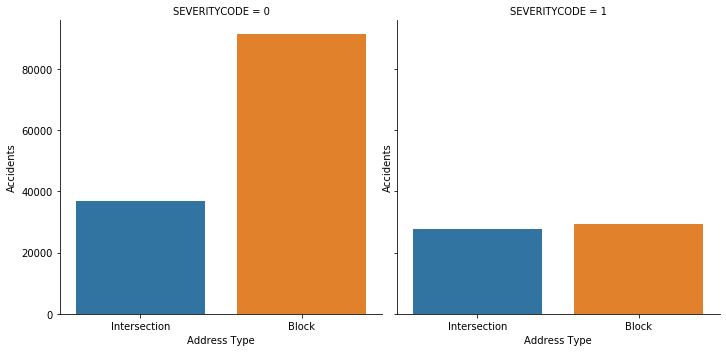

In [38]:
obj=sns.catplot(x = "ADDRTYPE", data = df,  kind='count', col= "SEVERITYCODE")
obj.set(xlabel='Address Type',ylabel='Accidents')

From the above distribution its immediately apparent that property damage was more prevalent at a block rather than an intersection, whereas accidents where injuries took place seem to be more evenly distributed across blocks and intersections. This makes logical sense considering that there is a lot more happening at an intersection, with pedestrian crossings, oncoming vehicles, signals and stop signs, which increase the likelihood that an accident at an intersection would involve injury.

Let's dive a bit deeper into this by plotting JUNCTIONTYPE next.

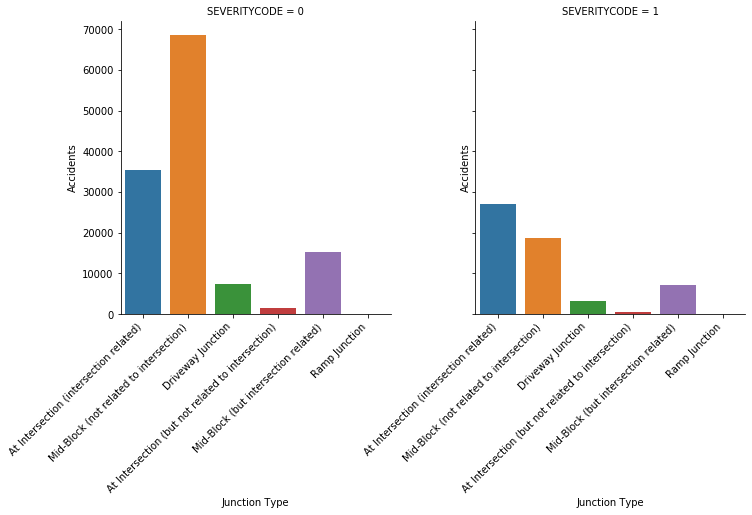

In [39]:
obj=sns.catplot(x = "JUNCTIONTYPE", data = df, kind = "count",  col= "SEVERITYCODE")
obj.set(xlabel='Junction Type',ylabel='Accidents')
obj.set_xticklabels(rotation=45, horizontalalignment='right')

This plot does seem to add more evidence to our earlier observation about property damage taking place on blocks and injurious damage happending more on intersections. This means that the above two variables are likely good indicators for classifying accident severity.

Let's plot the Lighting conditions, LIGHTCOND next.

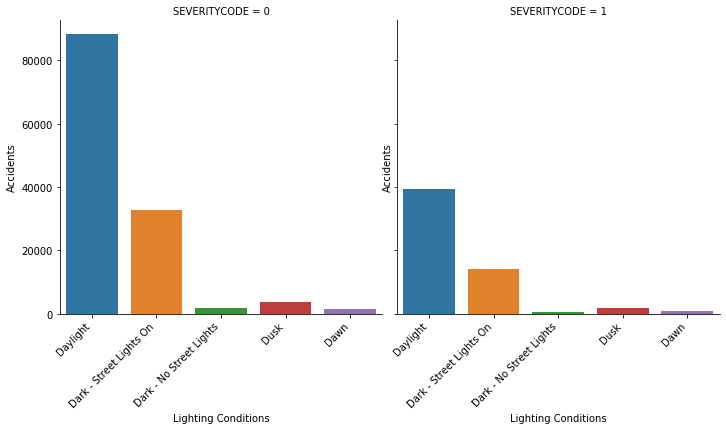

In [40]:
obj=sns.catplot(x = "LIGHTCOND", data = df, kind = "count",  col= "SEVERITYCODE")
obj.set(xlabel='Lighting Conditions',ylabel='Accidents')
obj.set_xticklabels(rotation=45, horizontalalignment='right')

It seems that most accidents, regardless of property damage or injury took place in Daylight. Again, this makes logical sense, considering that most commuters are driving during the daytime. On it's own, this variable may not be that useful in predicting accident severity, but in combination with another variables it may prove useful.

Let's plot the Road conditions, ROADCOND next.

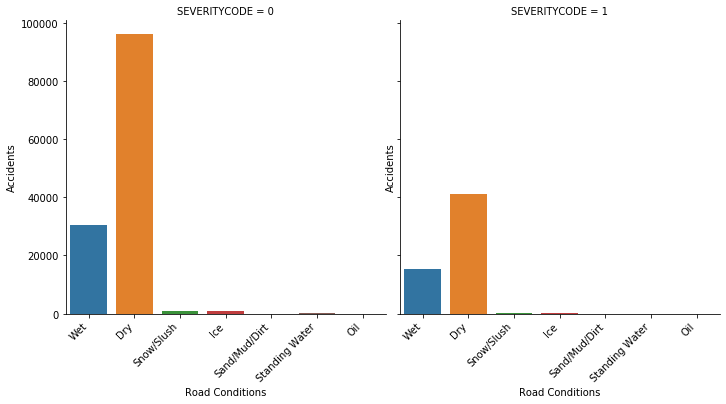

In [41]:
obj=sns.catplot(x = "ROADCOND", data = df, kind = "count",  col= "SEVERITYCODE")
obj.set(xlabel='Road Conditions',ylabel='Accidents')
obj.set_xticklabels(rotation=45, horizontalalignment='right')

Most of the accidents took place when the road was dry, indicating that the road condition by itself, may not play a huge role in an accident.

Let's plot WEATHER next.

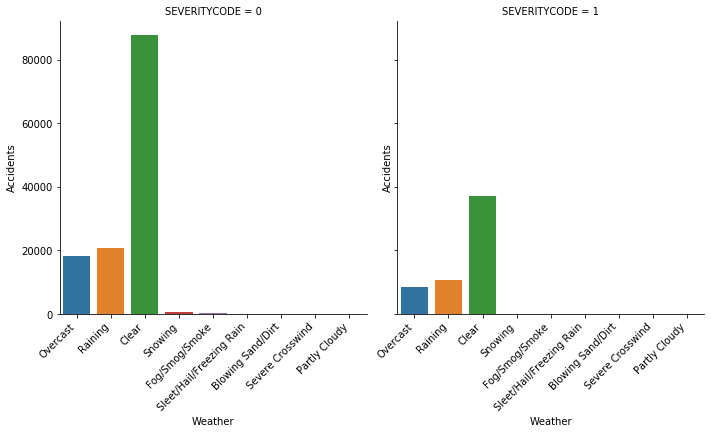

In [42]:
obj=sns.catplot(x = "WEATHER", data = df, kind = "count",  col= "SEVERITYCODE")
obj.set(xlabel='Weather',ylabel='Accidents')
obj.set_xticklabels(rotation=45, horizontalalignment='right')

Most of the accidents took place in Clear weather. Although for accidents where injury was involved, non-dry weather conditions seem slightly more prevalent.

Let's plot whether a driver was inattentive, INATTENTIONIND next.

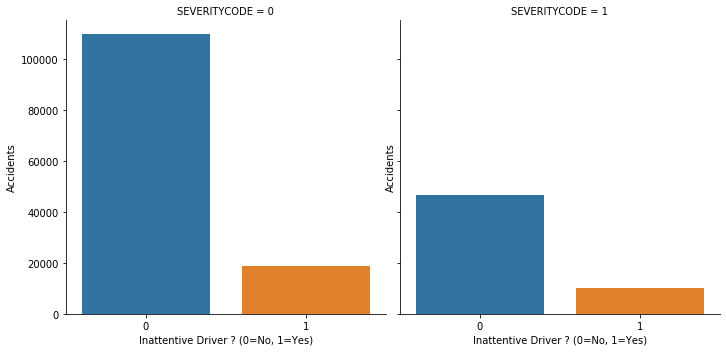

In [43]:
obj=sns.catplot(x = "INATTENTIONIND", data = df, kind = "count",  col= "SEVERITYCODE")
obj.set(xlabel='Inattentive Driver ? (0=No, 1=Yes)',ylabel='Accidents')

From the distributions, it seems that driver inattention seems to be more prevalent in accidents where injury was involved and less prevalent when only property was damaged.

Let's plot whether the driver was over the speed limit, SPEEDING next.

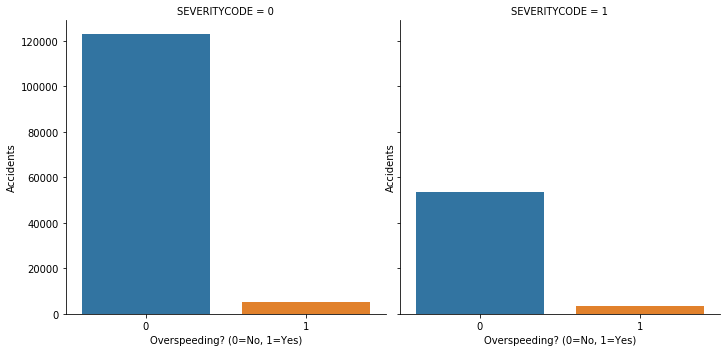

In [44]:
obj=sns.catplot(x = "SPEEDING", data = df, kind = "count",  col= "SEVERITYCODE")
obj.set(xlabel='Overspeeding? (0=No, 1=Yes)',ylabel='Accidents')

It seems that overspeeding doesn't seem to be a major factor in accidents according to the data. Logically, this could be because the data is mainly from accidents in the area city proper, where roads are more crowded and it is really difficult to drive fast.

Let's plot whether the driver was under the influence, UNDERINFL next.

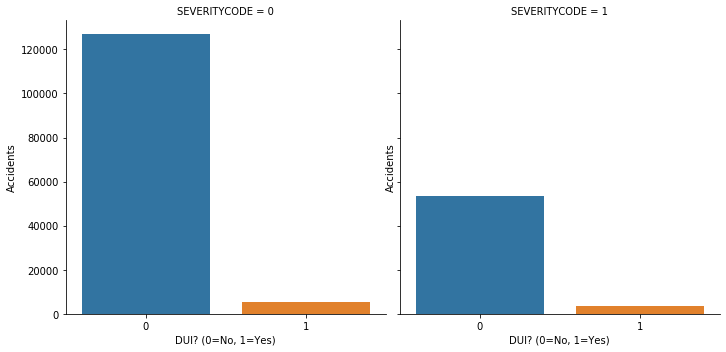

In [138]:
obj=sns.catplot(x = "UNDERINFL", data = df, kind = "count",  col= "SEVERITYCODE")
obj.set(xlabel='DUI? (0=No, 1=Yes)',ylabel='Accidents')

Like overspeeding before, DUI also doesn't seem to be a major indicator of an accident on it's own.

Let's plot COLLISIONTYPE next.

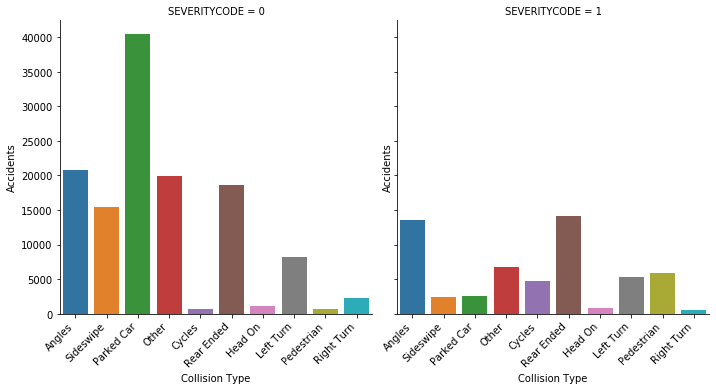

In [396]:
obj=sns.catplot(x = "COLLISIONTYPE", data = df, kind = "count",  col= "SEVERITYCODE")
obj.set(xlabel='Collision Type',ylabel='Accidents')
obj.set_xticklabels(rotation=45, horizontalalignment='right')

Immediately, collision type seems to be a much better classifier of the type of accident. The most common collision that involved property damage was collision with a parked car, followed by Angles. Logically, this makes sense since cars are parked all over city roads and blocks and drivers are more likely to hit a parked car in any accident involving property damage.

On the other hand, the most common collision where injury was involved seems to be Rear Ended, also followed by angles in second and pedestrian collisions in third. Rear ending on an open road is more likely to cause injury as compared to other collision types.

Let's plot the number of accidents distributed by year next.

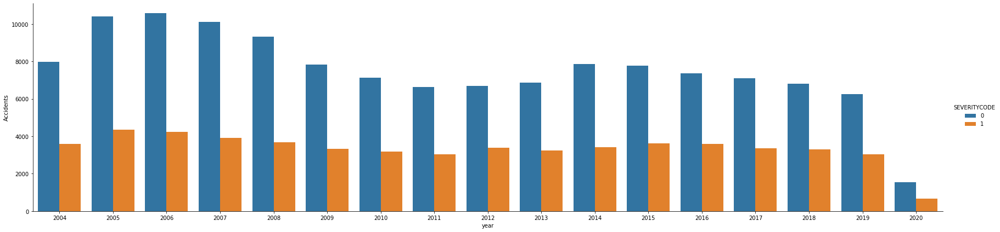

In [398]:
obj=sns.catplot(x = "year", data = df, kind = "count",  hue= "SEVERITYCODE", aspect=4, height=6)
obj.set(ylabel='Accidents')

Seems like accidents peaked in 2005-2006 before following a downward trend, followed by another rise in 2014-2015. Since then there does seem to be downward trend again, this could be because of improvements in road conditions, sign and signal installations, better traffic management or rising use of public transport.

Let's plot the number of accidents distributed by month next.

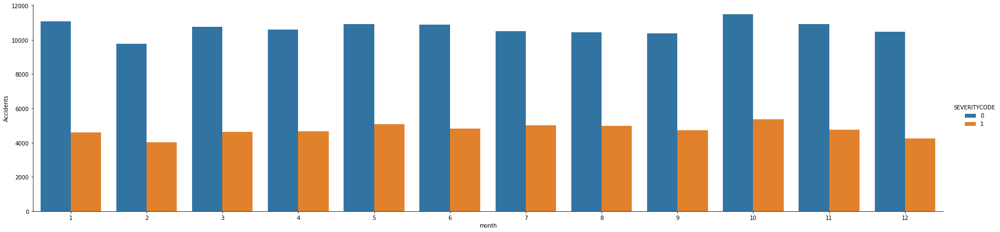

In [399]:
obj=sns.catplot(x = "month", data = df, kind = "count",  hue= "SEVERITYCODE", aspect=4, height=6)
obj.set(ylabel='Accidents')

Overall, there does not seem to be a significant pattern here with most of the accidents being distributed quite evenly.

Let's plot the accidents distributed by day of the week.

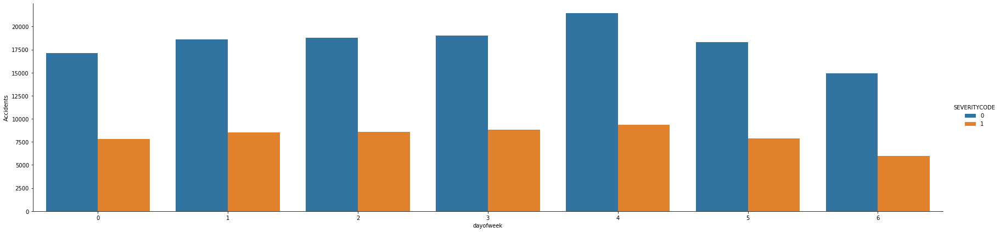

In [74]:
obj=sns.catplot(x = "dayofweek", data = df, kind = "count",  hue= "SEVERITYCODE", aspect=4, height=6)
obj.set(ylabel='Accidents')

We can see here that the number of accidents tend to peak on a Thursday(Day 4) and are lowest on a Saturday(Day 6) and Sunday(Day 0). This makes logical sense considering that Thursday is middle of the week and therefore likely to experience the most traffic. Since most people don't work on weekends, the number of vehicles on the road will be much less, ergo lesser number of accidents.

#### Map Visualization

We can visualize the clusters of accidents on a Map to gain a better idea where accidents seem to be ocurring in Seattle. We can use the Folium maps library to generate a map of Seattle and add the accidents onto the map using the Latitude and Longitudee coordinates within the dataset. Since Folium maps are a bit more computationally expensive, we'll only visualize accidents that took place in the year 2019.

Let's go ahead and generate the map.

In [76]:
map_df = df[(df["year"] == 2019)] 

In [77]:

latitude = 47.6062
longitude = -122.3321

map_viz = folium.Map(location=[latitude, longitude], zoom_start=12)

map_viz

Let's now add the accidents onto the map.

In [79]:
map_viz = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
accidents = plugins.MarkerCluster().add_to(map_viz)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(map_df['LATITUDE'], map_df['LONGITUDE'], map_df['SEVERITYDESC']):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label
    ).add_to(accidents)

# display map
map_viz

It seems most of the accidents seem to be around the city centre. This would make sense logically considering the city centre is most likely to be densely populated with vehicles, buildings and pedestrians alike. We can confirm this by also creating a simple scatter plot of the accidents using latitude and longitude coordinates.

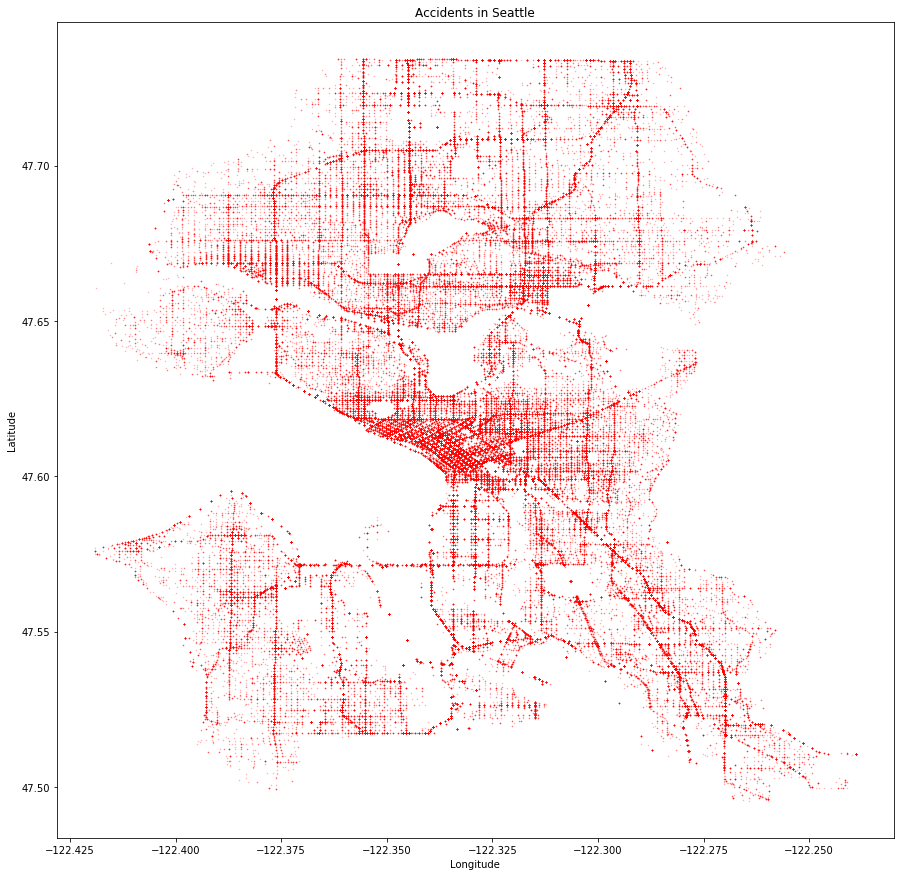

In [404]:
plt.figure(figsize=(15,15))

plt.plot( 'LONGITUDE', 'LATITUDE', data=df, marker='.', linestyle='', markersize=1.0, color="red", alpha=0.3)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Accidents in Seattle')
plt.show()

We can immediately see that the accidents become more and more denser as we move closer to the city center and more sparse as we move away from it.

That concludes our EDA. Let's move on to building our Model.

### 2. Data Modeling

Before we can begin modeling with our data, we have to process the data a bit further.

#### Data Preparation

In [45]:
#Copying into new dataframe
feature_df=df.copy()
feature_df.head()

,INCKEY,INCDTTM,ADDRTYPE,JUNCTIONTYPE,LONGITUDE,LATITUDE,SDOT_COLDESC,SDOT_COLCODE,COLLISIONTYPE,UNDERINFL,SPEEDING,INATTENTIONIND,WEATHER,ROADCOND,LIGHTCOND,SEVERITYDESC,SEVERITYCODE,year,month,dayofweek
0,1307,2013-03-27 14:54:00,Intersection,At Intersection (intersection related),-122.323148,47.703140,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",11,Angles,0,0,0,Overcast,Wet,Daylight,Injury Collision,1,2013,3,2
1,52200,2006-12-20 18:55:00,Block,Mid-Block (not related to intersection),-122.347294,47.647172,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE ...",16,Sideswipe,0,0,0,Raining,Wet,Dark - Street Lights On,Property Damage Only Collision,0,2006,12,2
2,26700,2004-11-18 10:20:00,Block,Mid-Block (not related to intersection),-122.334540,47.607871,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",14,Parked Car,0,0,0,Overcast,Dry,Daylight,Property Damage Only Collision,0,2004,11,3
3,1144,2013-03-29 09:26:00,Block,Mid-Block (not related to intersection),-122.334803,47.604803,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",11,Other,0,0,0,Clear,Dry,Daylight,Property Damage Only Collision,0,2013,3,4
4,17700,2004-01-28 08:04:00,Intersection,At Intersection (intersection related),-122.306426,47.545739,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",11,Angles,0,0,0,Raining,Wet,Daylight,Injury Collision,1,2004,1,2


In [46]:
feature_df.dtypes

INCKEY                     int64
INCDTTM           datetime64[ns]
ADDRTYPE                  object
JUNCTIONTYPE              object
LONGITUDE                float64
LATITUDE                 float64
SDOT_COLDESC              object
SDOT_COLCODE              object
COLLISIONTYPE             object
UNDERINFL                 object
SPEEDING                  object
INATTENTIONIND            object
WEATHER                   object
ROADCOND                  object
LIGHTCOND                 object
SEVERITYDESC              object
SEVERITYCODE               int64
year                       int64
month                      int64
dayofweek                  int64
dtype: object

Let's drop some columns that we will not be using for our modeling.

In [47]:
feature_df.drop(['INCKEY','INCDTTM','SDOT_COLDESC','SDOT_COLCODE','SEVERITYDESC','year','month'],axis=1,inplace=True)

In [48]:
feature_df.dtypes

ADDRTYPE           object
JUNCTIONTYPE       object
LONGITUDE         float64
LATITUDE          float64
COLLISIONTYPE      object
UNDERINFL          object
SPEEDING           object
INATTENTIONIND     object
WEATHER            object
ROADCOND           object
LIGHTCOND          object
SEVERITYCODE        int64
dayofweek           int64
dtype: object

A lot of our feature variables are multi-class categorical variables, which cannot be interpreted by scikit-learn. We will have to transform these categorical variables into dummy variables to make them suitable for modeling.

In [49]:
new_df = pd.get_dummies(data=feature_df, columns=['ADDRTYPE','JUNCTIONTYPE','COLLISIONTYPE','WEATHER','ROADCOND','LIGHTCOND'])
new_df.shape

(185140, 46)

Let's see how many attributes we have left now.

In [50]:
new_df.dtypes

LONGITUDE                                                         float64
LATITUDE                                                          float64
UNDERINFL                                                          object
SPEEDING                                                           object
INATTENTIONIND                                                     object
SEVERITYCODE                                                        int64
dayofweek                                                           int64
ADDRTYPE_Block                                                      uint8
ADDRTYPE_Intersection                                               uint8
JUNCTIONTYPE_At Intersection (but not related to intersection)      uint8
JUNCTIONTYPE_At Intersection (intersection related)                 uint8
JUNCTIONTYPE_Driveway Junction                                      uint8
JUNCTIONTYPE_Mid-Block (but intersection related)                   uint8
JUNCTIONTYPE_Mid-Block (not related to

#### Split Data into Training Set and Testing Set

As is customary with any machine learning project, we will split our data into two sets: Training Data Set and Testing Data Set. As the name implies, we will use the Training Set to build and train our model and then test it's accuracy on the testing set. We'll use 70% of the data for training the model and 30% of the data to perform our out of sample testing.

Let's begin by creating two objects, one for our feature sets and the other for the target variable.

In [52]:
X = new_df.drop('SEVERITYCODE', axis=1)
y=new_df['SEVERITYCODE'].values

In [53]:
#Convert target feature to string type for classification
y=y.astype("str")

In [54]:

X_trainset, X_testset, y_trainset, y_testset = train_test_split(X, y, test_size=0.3, random_state=3)

In [55]:
print("Number of Records in Training Set:", X_trainset.shape[0])
print("Number of Records in Testing Set:", X_testset.shape[0])

Number of Records in Training Set: 129598
Number of Records in Testing Set: 55542


#### Decision Tree Model

Decision tree learning is one of the predictive modelling approaches used in statistics, data mining and machine learning. It uses a decision tree (as a predictive model) to go from observations about an item (represented in the branches) to conclusions about the item's target value (represented in the leaves). Tree models where the target variable can take a discrete set of values are called classification trees; in these tree structures, leaves represent class labels and branches represent conjunctions of features that lead to those class labels.

It is a supervised learning algorithm and utilizes recursive partitioning to split the data based on conditions in the features to classifiy the cases in each class. This is primarily based on reducing the entropy in each node as much as possible i.e. homogenity of the cases. In most scenarios, the user must define how deep they want the tree to go.

In [56]:
#Creation of column names, this will be used later while constructing the tree
target_df=new_df.drop(['SEVERITYCODE'],axis=1)

Let's start by building the Decision Tree object. For this decision tree, we will use set the criterion as Entropy and set a max depth for our tree as 5.

In [57]:
decTree = DecisionTreeClassifier(criterion="entropy", max_depth = 5)
decTree

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [58]:
decTree.fit(X_trainset,y_trainset)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

Let's create another object consisting of the predicted values using the decision tree and compare it with the actual values to get the accuracy score.

In [59]:
predTree = decTree.predict(X_testset)

In [60]:
print("DecisionTrees's Accuracy: ", metrics.accuracy_score(y_testset, predTree))

DecisionTrees's Accuracy:  0.7418170033488171


Seems like it's a fairly accurate model with about 74% correct classification of cases. We'll examine some more metrics in the evaluation phase such as f-1 score and Jaccard's Similarity Index.

With that done, let's visually construct the decision tree.

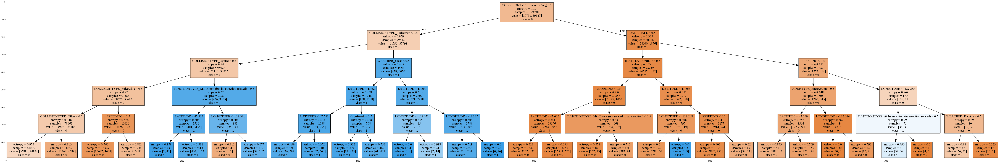

In [62]:
dot_data = StringIO()
filename = "dectree.png"
featureNames = target_df.columns
targetNames = feature_df["SEVERITYCODE"].unique().tolist()
out=tree.export_graphviz(decTree,feature_names=featureNames, out_file=dot_data, class_names= np.unique(y_trainset), filled=True,  special_characters=True,rotate=False)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(filename)
img = mpimg.imread(filename)
plt.figure(figsize=(100, 200))
plt.imshow(img,interpolation='nearest')

#### K-Nearest-Neighbor Model

K-Nearest Neighbors is another supervised learning algorithm, which is primarily based on the distance between individual data points. This distance metric can be either Euclidean or Minkowski distance. The 'K' represents the number of nearest data points that an individual case will be compared to, in order to recerive a classification. For example, if we set k=4, and the four data points nearest to an individual case belong to class A, then the algorithm will also classify that case as belonging to class A.

For the remainder of our algorithms, we will need to standardize our data. So let's go ahead and do that.

In [63]:
X = preprocessing.StandardScaler().fit(X).transform(X.astype(float))
X[0:5]

array([[ 0.24480028,  1.48634069, -0.22391036, -0.22155936, -0.42976606,
        -0.49018575, -1.36601195,  1.36601195, -0.10636106,  1.40095204,
        -0.24619003, -0.37161463, -0.94552385, -0.02780262,  2.09309297,
        -0.17243558, -0.10410483, -0.28159258, -0.41008721, -0.55026685,
        -0.19067517, -0.46425346, -0.12623542, -0.32706611, -0.0164359 ,
        -1.4403288 , -0.0545357 ,  2.42845622, -0.00519686, -0.45499472,
        -0.01138633, -0.02460313, -0.06914704, -1.69005324, -0.07957627,
        -0.01627067, -0.0184499 , -0.07276102, -0.02313043,  1.74781044,
        -0.11857542, -0.58120056, -0.11433474,  0.67053904, -0.17855112],
       [-0.56183061,  0.49177129, -0.22391036, -0.22155936, -0.42976606,
        -0.49018575,  0.73205802, -0.73205802, -0.10636106, -0.71380031,
        -0.24619003, -0.37161463,  1.05761478, -0.02780262, -0.47776186,
        -0.17243558, -0.10410483, -0.28159258, -0.41008721, -0.55026685,
        -0.19067517, -0.46425346, -0.12623542,  3.

In [64]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.3, random_state=3)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (129598, 45) (129598,)
Test set: (55542, 45) (55542,)


Let's go ahead and create the KNN object. For now, let's select a value of k=4.

In [424]:
k = 4
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
neigh

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=4, p=2,
                     weights='uniform')

Now let's use the model to get a set of predicted values and compare them with the actual values.

In [425]:
yhat_knn = neigh.predict(X_test)
yhat_knn[0:5]

array(['0', '0', '0', '0', '0'], dtype='<U21')

In [427]:
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat_knn))

Test set Accuracy:  0.7230024125886716


This also seems to be a fairly good model with a 72% accuracy of classification. However, what if there are other values of k which may give us higher accuracy? Let's run the following code to find out.

In [ ]:
Ks = 10
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
for n in range(1,Ks):
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train,y_train)
    yhat_knn=neigh.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat_knn)
std_acc[n-1]=np.std(yhat_knn==y_test)/np.sqrt(yhat_knn.shape[0])

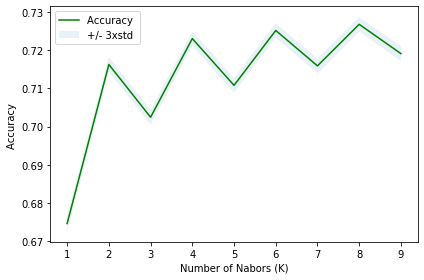

In [430]:
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Nabors (K)')
plt.tight_layout()
plt.show()

It seems like we could get a higher accuracy at k=8, so let's run the model again at k=8.

In [65]:
k = 8
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
neigh

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=8, p=2,
                     weights='uniform')

In [66]:
yhat_knn = neigh.predict(X_test)
yhat_knn[0:5]

array(['0', '0', '0', '0', '0'], dtype='<U21')

In [67]:
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat_knn))

Test set Accuracy:  0.7267293219545569


There doesn't seem to be a huge difference in the accuracy. Nevertheless, it's always good practice to run the algorithm at different values of k and observe the differences.

#### Logistic Regression

Unlike the typical Linear Regression which is used in modeling when predicitng a continous target variable, Logistic Regression is used when the target variable is a binary categorical variable. As its name implies, Logistic Regression uses a logistic function in estimating the parameters of a logistic model (a form of binary regression), where the two classes are some sort of positive-negative or in other words, '0' and '1'.  

In the logistic model, the log-odds (the logarithm of the odds) for the value labeled "1" is a linear combination of one or more independent variables ("predictors"), the independent variables can each be a binary variable (two classes, coded by an indicator variable) or a continuous variable (any real value). The corresponding probability of the value labeled "1" can vary between 0 (certainly the value "0") and 1 (certainly the value "1"), hence the labeling; the function that converts log-odds to probability is the logistic function, hence the name. 

Lets start by creating the Logistic Regression object and fitting the model on our training set.

In [68]:
LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train,y_train)
LR

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

Now we can get our set of predicted values to compare against the actual values.

In [69]:
yhat_log = LR.predict(X_test)
yhat_log

array(['0', '0', '0', ..., '0', '0', '0'], dtype='<U21')

As mentioned before, there is the additional parameter of logit or logarithmic probability of how likely the predicted value is close to the class '1'. This value itself is a probablity value between 0 and 1. This value will then be used in calculating the evaluation metric log loss.

In [70]:
yhat_prob = LR.predict_proba(X_test)
yhat_prob

array([[0.94065723, 0.05934277],
       [0.61187112, 0.38812888],
       [0.94335195, 0.05664805],
       ...,
       [0.78433986, 0.21566014],
       [0.56212671, 0.43787329],
       [0.62532627, 0.37467373]])

In [71]:
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat_log))

Test set Accuracy:  0.7413848979150913


The preliminary accuracy of this model seems good, however we will perform more in-depth evaluation during the Model Evaluation phase.

### 3. Model Evaluation

In this phase, we will evaluate our model accuracy by applying the models on the test data that we had created earlier, to observe out of sample accuracy. As we had mentioned in the methodology section, we will be using the following metrics to evaluate our machine learning models:

  * F-1 Score: In statistical analysis of binary classification, the F1 score is a measure of a test's accuracy. It is calculated from the precision and recall of the test, where the precision is the number of correctly identified positive results divided by the number of all positive results, including those not identified correctly, and the recall is the number of correctly identified positive results divided by the number of all samples that should have been identified as positive.
  
  * Jaccard's Similarity Index: The Jaccard index, also known as Intersection over Union and the Jaccard similarity coefficient, is a statistic used for gauging the similarity and diversity of sample sets. The Jaccard coefficient measures similarity between finite sample sets, and is defined as the size of the intersection divided by the size of the union of the sample sets.
  
  * Log Loss (Logistic Regression Only): Cross-entropy loss, or log loss, measures the performance of a classification model whose output is a probability value between 0 and 1. Cross-entropy loss increases as the predicted probability diverges from the actual label. So predicting a probability of .012 when the actual observation label is 1 would be bad and result in a high loss value. A perfect model would have a log loss of 0.
  
Before, we proceed to calculate the metrics, let's define a function to plot a confusion matrix of the predicted labels and the actual labels.



In [96]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

#### Decision Tree Model Evaluation

Let's compute the confusion matrix first.

Confusion matrix, without normalization
[[38050   420]
 [13920  3152]]


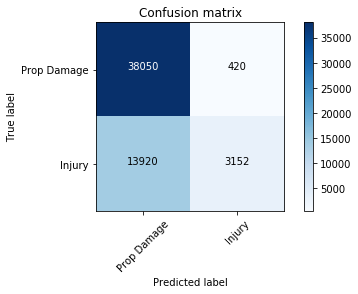

In [82]:
cnf_matrix = confusion_matrix(y_test, predTree, labels=['0','1'])
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Prop Damage','Injury'], normalize= False,  title='Confusion matrix')

Let's generate the classification report to see the precision, recall and the f1 scores.

In [83]:
print (classification_report(y_test, predTree))

              precision    recall  f1-score   support

           0       0.73      0.99      0.84     38470
           1       0.88      0.18      0.31     17072

    accuracy                           0.74     55542
   macro avg       0.81      0.59      0.57     55542
weighted avg       0.78      0.74      0.68     55542



In [86]:
print(f1_score(y_test, predTree, average='weighted') )

0.6766680354473458


Let's generate the Jaccard Similarity coefficient as well.

In [85]:
print(jaccard_similarity_score(y_test, predTree))

0.7418170033488171


In a similar manner, let's evaluate the remaining models.

#### K-Nearest Neighbor Evaluation

Confusion matrix, without normalization
[[34939  3531]
 [11647  5425]]


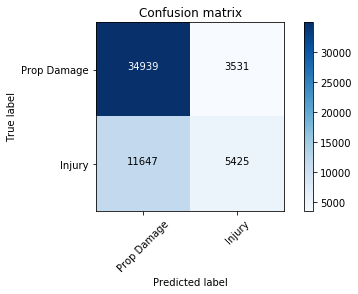

In [87]:
cnf_matrix = confusion_matrix(y_test, yhat_knn, labels=['0','1'])
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Prop Damage','Injury'], normalize= False,  title='Confusion matrix')

In [88]:
print (classification_report(y_test, yhat_knn))

              precision    recall  f1-score   support

           0       0.75      0.91      0.82     38470
           1       0.61      0.32      0.42     17072

    accuracy                           0.73     55542
   macro avg       0.68      0.61      0.62     55542
weighted avg       0.71      0.73      0.70     55542



In [89]:
print(f1_score(y_test, yhat_knn, average='weighted') )

0.6971616321959746


In [90]:
print(jaccard_similarity_score(y_test, yhat_knn))

0.7267293219545569


#### Logistic Regression Evaluation

Confusion matrix, without normalization
[[37162  1308]
 [13056  4016]]


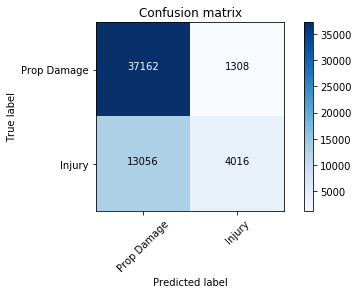

In [91]:
cnf_matrix = confusion_matrix(y_test, yhat_log, labels=['0','1'])
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Prop Damage','Injury'], normalize= False,  title='Confusion matrix')

In [92]:
print (classification_report(y_test, yhat_log))

              precision    recall  f1-score   support

           0       0.74      0.97      0.84     38470
           1       0.75      0.24      0.36     17072

    accuracy                           0.74     55542
   macro avg       0.75      0.60      0.60     55542
weighted avg       0.74      0.74      0.69     55542



In [93]:
print(f1_score(y_test, yhat_log, average='weighted') )

0.6906842363614918


In [94]:
print(jaccard_similarity_score(y_test, yhat_log))

0.7413848979150913


For the logistic regression, we also calculate the log loss. In this case, ideally we want a lower value.

In [95]:
print(log_loss(y_test, yhat_prob))

0.5025555485178824


## Results and Discussion<a name="results"></a>

Let's compile the results of the evaluation metrics for our models.

| Algorithm          | Jaccard | F1-score | LogLoss |
|--------------------|---------|----------|---------|
| KNN                | 0.7267  | 0.6971   | NA      |
| Decision Tree      | 0.7418  | 0.6766   | NA      |
| Logistic Regression| 0.7413  | 0.6906   | 0.5025  |

On observation, the 3 models seem very similar in terms of our evaluation metrics. While all 3 models do perform fairly well, we get a more clearer picture if we look at the precision and recall of the models in predicting the binary classes.

| Algorithm          | Class   | Precision| Recall  |
|--------------------|---------|----------|---------|
| KNN                |    0    | 0.75     | 0.91    |
|                    |    1    | 0.61     | 0.32    |
| Decision Tree      |    0    | 0.73     | 0.99    |
|                    |    1    | 0.88     | 0.18    |
| Logistic Regression|    0    | 0.74     | 0.97    |
|                    |    1    | 0.71     | 0.24    |

We can immediately see that our KNN model has a relatively low precision in classifiying cases where the accident severity is Injury or '1', as compared to the Decision Tree and Logistic Regression models, where the precision is a lot more evenly distributed between the binary classes. The recall distribution is pretty much similar across all models, so it's not a huge diffrentiator.

The recommendation to the stakeholders in that case would be to use the Decision Tree and Logistic Regression Models side-by-side together and compare the results when predicting accident severity.

From our overall analysis therefore, we have managed to glean the following insights:
   * Accidents that involved  property damage were more likely to happen on a block rather than an intersection. The distribution of accidents that involve injury however are pretty evenly distributed between intersections and blocks, implying that intersections are far more likely to have an accident where an injury is involved.
   * This seems to be confirmed upon examining the types of junctions where the accidents took place. Highest number of property damage accidents were recorded at a mid-block, while injury accidents mostly took place at an intersection.
   * The weather by itself does not seem to play a huge role in the severity of an accident, however it may be used in combination with other attributes in a model for predicting accident severity. The same applies to road condition and light condition.
   * From the distributions, it does seem that driver inattentiveness seems to be more prevalent in accidents where injury was involved as compared to accidents where only property was damaged.
   * There don't seem to be that many accidents where speeding or DUI was recorded.
   * Upon examining collision types, we observed that collision with a parked car was the most common collision in accidents that involved property damage, whereas rear ending was most common collision type leading to injury.
   * The overall number of accidents do seem to be on a somewhat downward trend since 2014.
   * The number of accidents tend to peak on a Thursday and subside on the weekend, presumably when there are less vehicles on the road.
   * From the map visualization, it does seem that most accidents tend to take place in the Belltown neighborhood, close to downtown Seattle.

By using a combination of the most relevant features, our data models can correctly predict whether an accident is likely to involve injury or property damage. The Seattle department of transportation or the Seattle police department can then input information into the model to determine whether injurious accidents are more likely to occur, given certain conditions. They can then take some preventive or corrective actions such as :
   * Installing appropriate road signs where necessary. 
   * Issue accident warnings. 
   * Increase development in areas with poor road or light conditions. 
   * Increase the fines for DUI or Reckless Driving.
   * Deploy more traffic police on days which generally see more accidents such as Thursday.
   * Keep emergency crews on alert in certain locations.
   * Install more traffic cams in densely populated areas.

## Conclusion<a name="conclusion"></a>

We have analyzed the relationships between many attributes and how they can impact the severity of an accident. We performed analysis to see how each indivdiual attribute such as road condition or address type can play a role in an accident and we even plotted maps to examine areas where accidents are more likely to occur. We built multiple data models that can use these attributes together to predict whether an accident could involve personal injury or not. The bigger goal from this project would be to use this information to reduce the number of injury-causing accidents taking place in the city of Seattle and eventually, reducing the number of accidents altogether.



#### Author: Mohit R Mhapuskar

Email : mmhapusk@stevens.edu

Linkedin : https://www.linkedin.com/in/mmhapusk/